In [7]:
import numpy as np
from PIL import Image
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

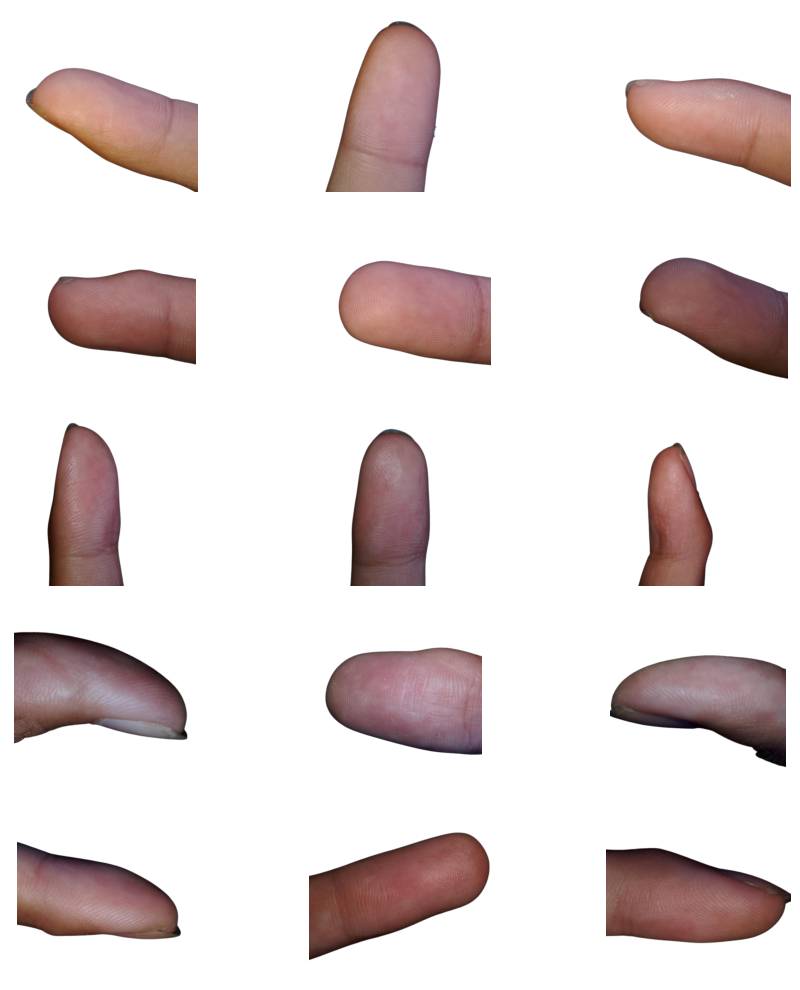

In [8]:
# Daftar nama folder yang berisi file gambar
folder_names = ['sidikjari/jari1', 'sidikjari/jari2', 'sidikjari/jari3','sidikjari/jari4', 'sidikjari/jari5' ]  # Tambahkan folder lain sesuai kebutuhan

# Mengumpulkan semua file gambar dari setiap folder
image_files = []
for folder_name in folder_names:
    image_files.extend([os.path.join(folder_name, f) for f in os.listdir(folder_name) if os.path.isfile(os.path.join(folder_name, f))])

# Menghitung jumlah gambar
num_images = len(image_files)

# Menentukan ukuran grid untuk menampilkan gambar (misalnya, 3x3 grid)
grid_size = (5, 3)

# Membuat subplots
fig, axes = plt.subplots(*grid_size, figsize=(10, 10))

# Menampilkan setiap gambar pada subplot yang sesuai
for idx, image_path in enumerate(image_files):
    if idx >= grid_size[0] * grid_size[1]:
        break  # Jika gambar lebih banyak dari grid, hentikan penambahan gambar
    
    img = mpimg.imread(image_path)
    
    # Menentukan posisi subplot
    ax = axes[idx // grid_size[1], idx % grid_size[1]]
    ax.imshow(img)
    ax.axis('off')  # Menghilangkan sumbu

# Menghilangkan subplot yang kosong jika jumlah gambar kurang dari grid
for idx in range(num_images, grid_size[0] * grid_size[1]):
    fig.delaxes(axes.flatten()[idx])

# Menampilkan gambar gabungan
plt.tight_layout()
plt.show()

In [16]:
# Fungsi untuk mengonversi citra ke grayscale menggunakan rumus (R + G + B) / 3
def image_to_grayscale(image):
    if image.mode != "RGB":
        image = image.convert("RGB")
    
    width, height = image.size
    grayscale_array = np.zeros((height, width), dtype=np.uint8)
    
    pixels = image.load()
    for i in range(width):
        for j in range(height):
            r, g, b = pixels[i,j]
            grayscale_value = int((r + g + b) / 3)
            grayscale_array[j,i] = grayscale_value
    
    grayscale_image = Image.fromarray(grayscale_array, mode='L')
    return grayscale_image

In [17]:
# Fungsi untuk melakukan segmentasi dengan metode Global Threshold
def global_threshold(image, threshold):
    # Pastikan citra dalam format grayscale
    if image.mode != 'L':
        image = convert_to_grayscale(image)

    # Konversi citra grayscale menjadi numpy array
    grayscale_array = np.array(image)

    # Terapkan threshold untuk segmentasi
    binary_array = np.where(grayscale_array > threshold, 255, 0).astype(np.uint8)

    # Konversi array numpy menjadi citra mode 'L'
    binary_image = Image.fromarray(binary_array, mode='L')

    return binary_image

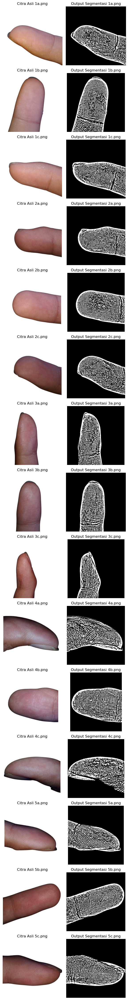

In [11]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2

def convert_to_grayscale(image):
    return image.convert('L')

def adaptive_threshold_mean(grayscale_image, block_size):
    img_array = np.array(grayscale_image)
    if block_size % 2 == 0:
        block_size += 1
    mean_filtered = cv2.blur(img_array, (block_size, block_size))
    thresholded = img_array > mean_filtered
    return Image.fromarray(thresholded.astype(np.uint8) * 255)

def main_segmentasi():
    folder_names = ['sidikjari/jari1', 'sidikjari/jari2', 'sidikjari/jari3', 'sidikjari/jari4', 'sidikjari/jari5']
    block_size = 15

    # Hitung total jumlah citra
    total_images = sum(len(files) for _, _, files in os.walk('sidikjari') if files)

    # Tentukan ukuran grid subplot
    cols = 2
    rows = total_images

    fig, axs = plt.subplots(rows, cols, figsize=(6, 3 * rows))

    row_index = 0
    for folder in folder_names:
        for filename in os.listdir(folder):
            if filename.endswith(".jpg") or filename.endswith(".png"):
                image_path = os.path.join(folder, filename)
                image = Image.open(image_path)

                grayscale_image = convert_to_grayscale(image)
                segmented_image2 = adaptive_threshold_mean(grayscale_image, block_size)

                axs[row_index, 0].imshow(image)
                axs[row_index, 0].set_title(f'Citra Asli {filename}')
                axs[row_index, 0].axis('off')

                axs[row_index, 1].imshow(segmented_image2, cmap='gray')
                axs[row_index, 1].set_title(f'Output Segmentasi {filename}')
                axs[row_index, 1].axis('off')

                row_index += 1

    plt.tight_layout()
    plt.show()

main_segmentasi()


In [14]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2

def convert_to_grayscale(image):
    return image.convert('L')

def adaptive_threshold_mean(grayscale_image, block_size):
    img_array = np.array(grayscale_image)
    if block_size % 2 == 0:
        block_size += 1
    mean_filtered = cv2.blur(img_array, (block_size, block_size))
    thresholded = img_array > mean_filtered
    return Image.fromarray(thresholded.astype(np.uint8) * 255)

def main_segmentasi():
    folder_names = ['sidikjari/jari1', 'sidikjari/jari2', 'sidikjari/jari3', 'sidikjari/jari4', 'sidikjari/jari5']
    block_size = 15
    output_folder = 'hasil segmentasi'

    # Buat folder output jika belum ada
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    row_index = 0
    for folder in folder_names:
        for filename in os.listdir(folder):
            if filename.endswith(".jpg") or filename.endswith(".png"):
                image_path = os.path.join(folder, filename)
                image = Image.open(image_path)

                grayscale_image = convert_to_grayscale(image)
                segmented_image2 = adaptive_threshold_mean(grayscale_image, block_size)

                # Simpan gambar asli
                original_image_path = os.path.join(output_folder, f'asli_{filename}')
                image.save(original_image_path)

                # Simpan hasil segmentasi
                segmented_image_path = os.path.join(output_folder, f'segmentasi_{filename}')
                segmented_image2.save(segmented_image_path)

                row_index += 1

    print(f'Hasil segmentasi telah disimpan di folder: {output_folder}')

main_segmentasi()

Hasil segmentasi telah disimpan di folder: hasil segmentasi


Folder: hasil segmentasi


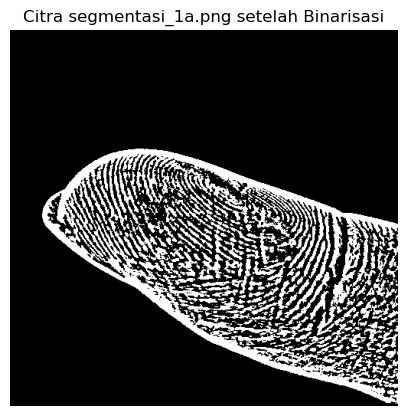

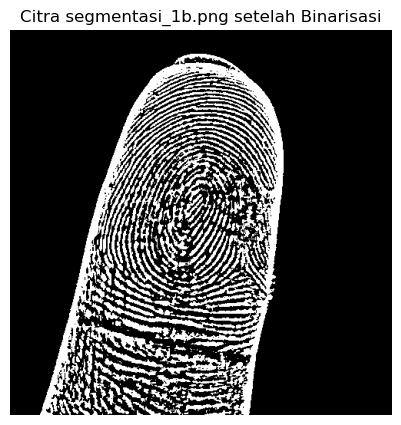

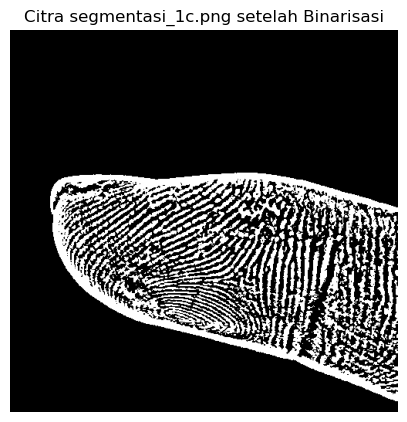

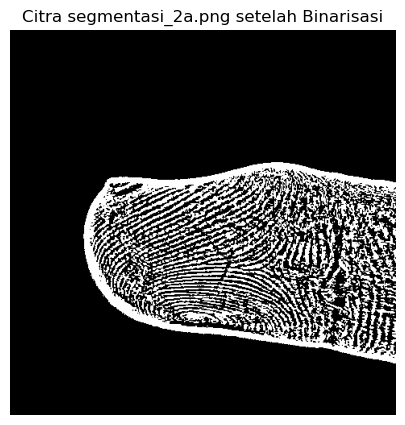

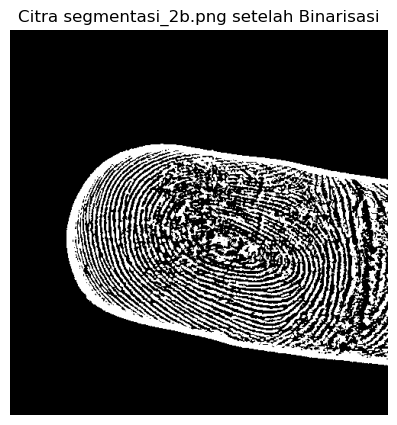

...

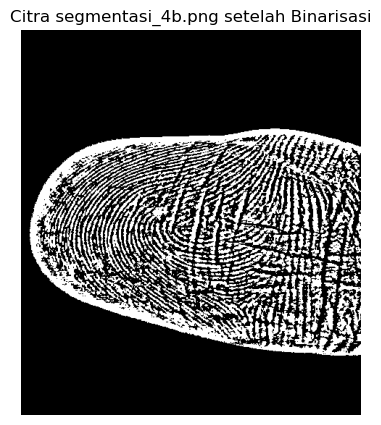

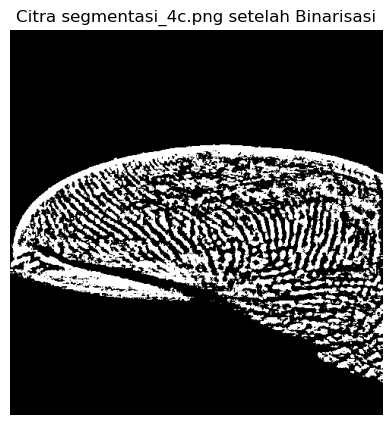

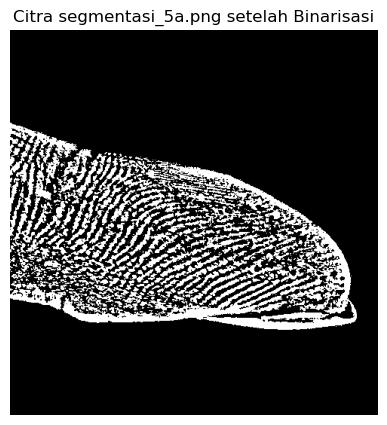

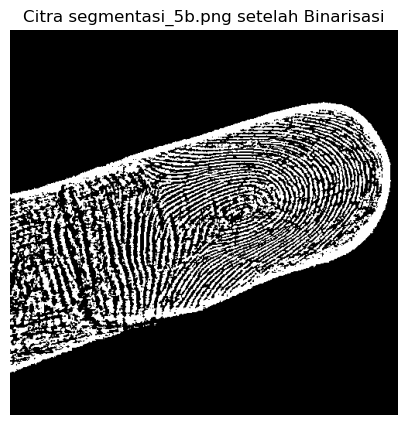

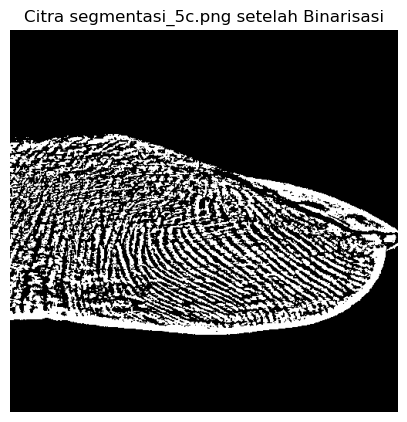

In [18]:
import cv2
import matplotlib.pyplot as plt
import os

# Fungsi untuk menampilkan citra
def show_image(title, image, cmap_type='gray'):
    plt.figure(figsize=(5, 5))
    plt.title(title)
    plt.imshow(image, cmap=cmap_type)
    plt.axis('off')
    plt.show()

# Daftar folder dengan citra sidik jari
folder_names = ['hasil segmentasi']

# Loop melalui setiap folder
for folder in folder_names:
    print(f"Folder: {folder}")
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            image_path = os.path.join(folder, filename)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Binarisasi citra
            _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

            # Menampilkan citra biner
            show_image(f"Citra {filename} setelah Binarisasi", binary_image)


Folder: hasil segmentasi


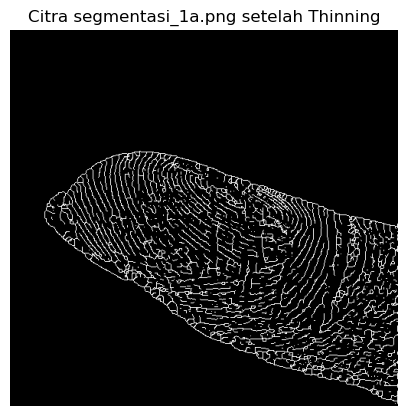

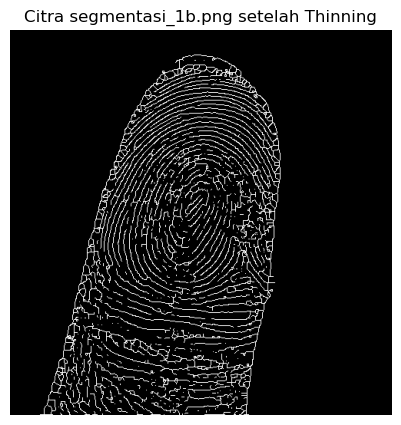

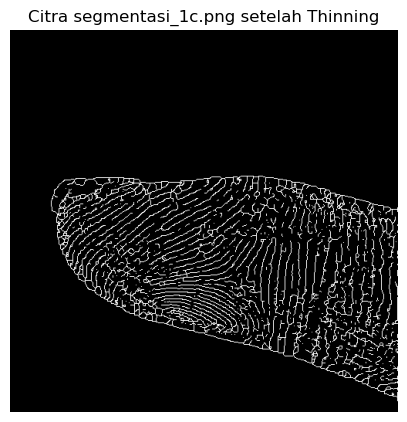

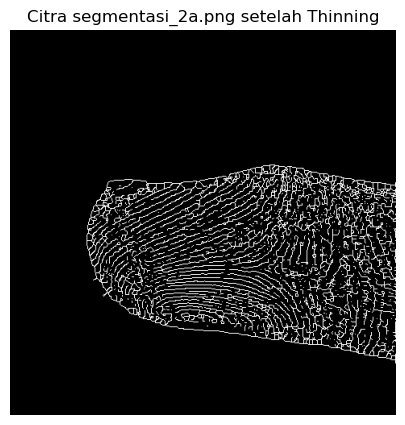

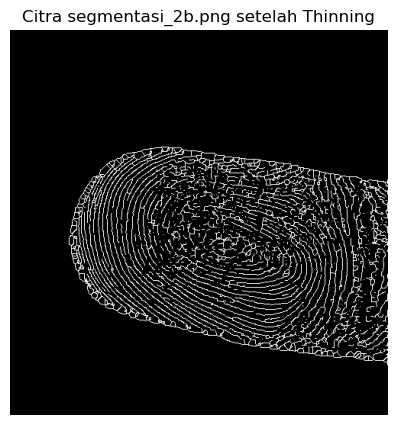

...

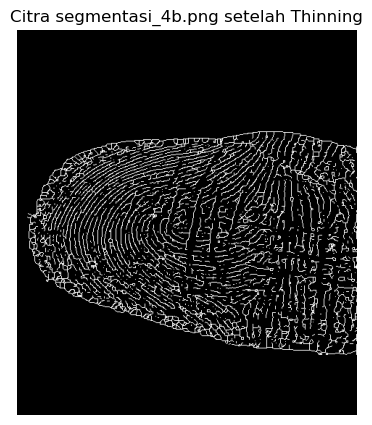

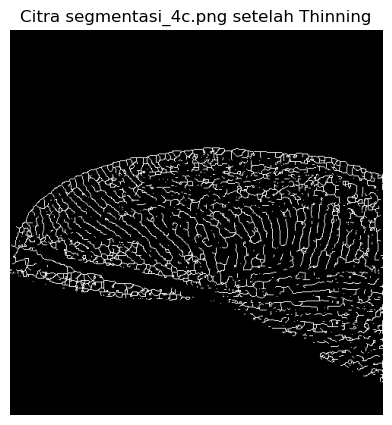

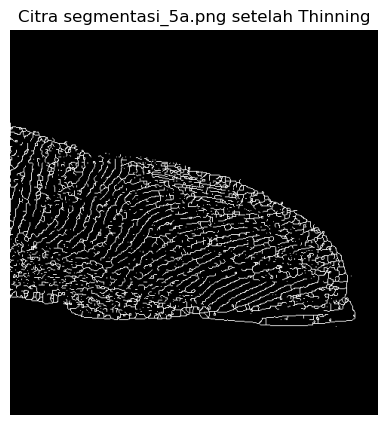

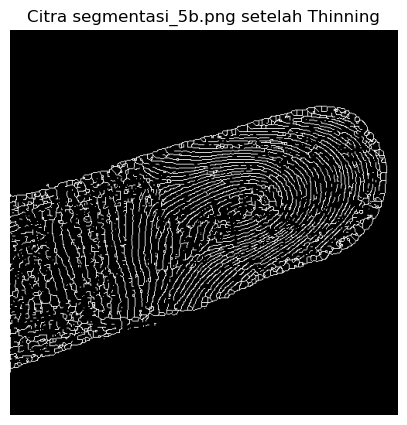

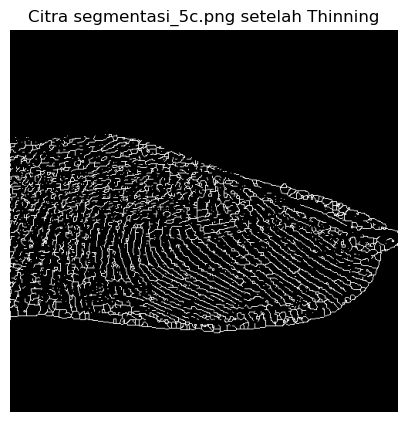

In [19]:
import cv2
import matplotlib.pyplot as plt
import os

# Fungsi untuk menampilkan citra
def show_image(title, image, cmap_type='gray'):
    plt.figure(figsize=(5, 5))
    plt.title(title)
    plt.imshow(image, cmap=cmap_type)
    plt.axis('off')
    plt.show()

# Fungsi untuk melakukan thinning citra biner
def thinning_image(binary_image):
    # Inisialisasi citra hasil thinning
    thinned_image = np.zeros(binary_image.shape, dtype=np.uint8)
    
    # Algoritma Zhang-Suen untuk thinning
    skeleton = cv2.ximgproc.thinning(binary_image)
    thinned_image[skeleton > 0] = 255
    
    return thinned_image

# Daftar folder dengan citra sidik jari
folder_names = ['hasil segmentasi']

# Loop melalui setiap folder
for folder in folder_names:
    print(f"Folder: {folder}")
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            image_path = os.path.join(folder, filename)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Binarisasi citra
            _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

            # Thinning citra biner
            thinned_image = thinning_image(binary_image)

            # Menampilkan citra setelah thinning
            show_image(f"Citra {filename} setelah Thinning", thinned_image)


Folder: hasil segmentasi


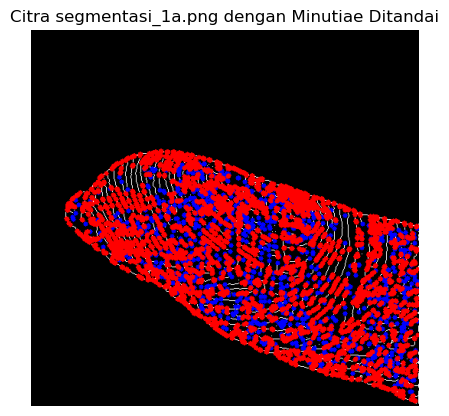

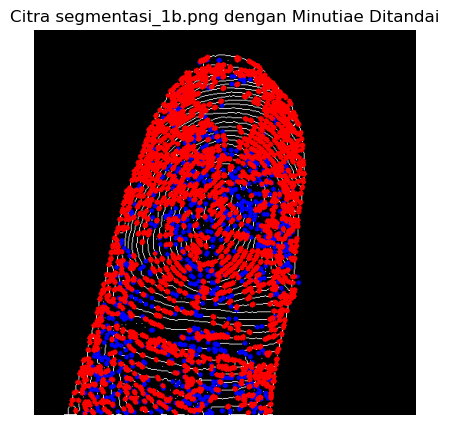

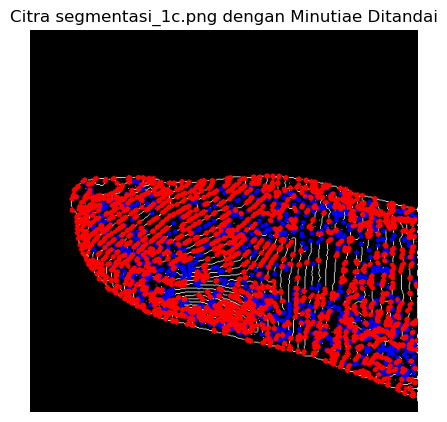

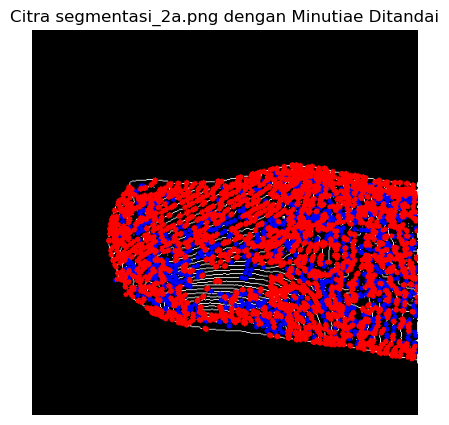

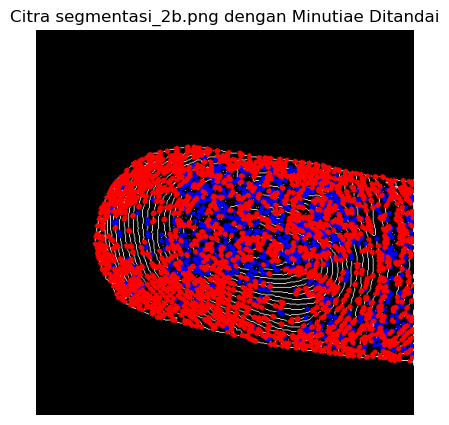

...

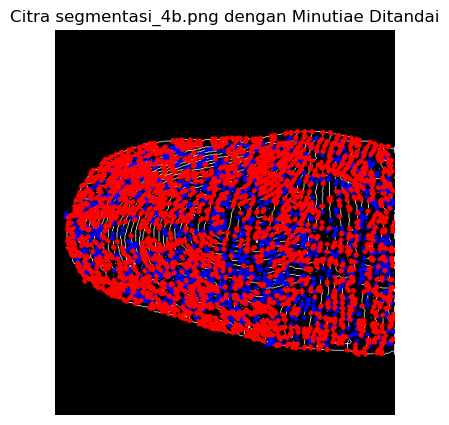

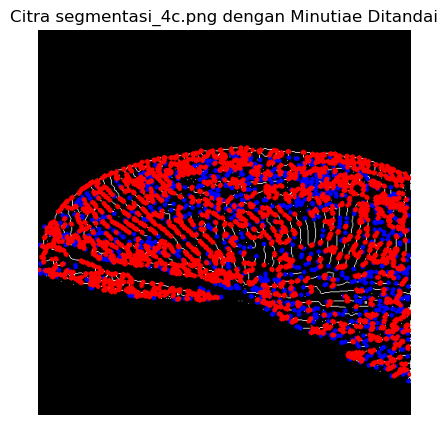

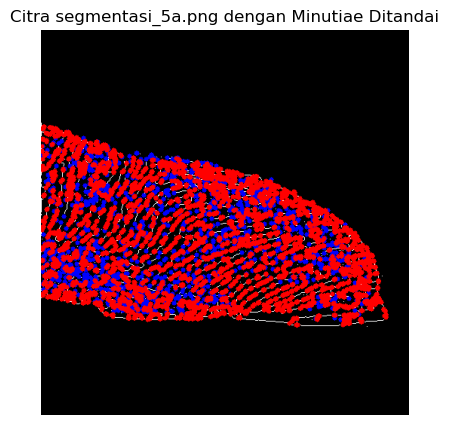

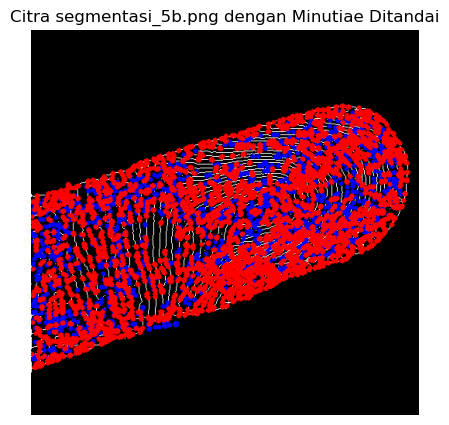

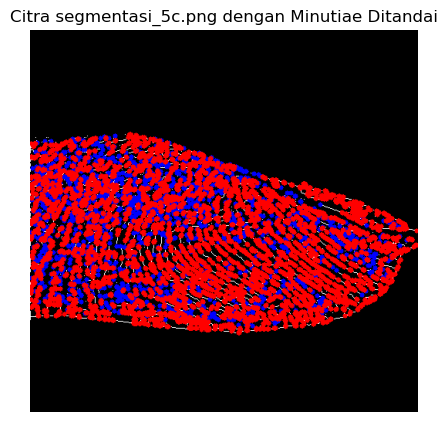

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Fungsi untuk menampilkan citra
def show_image(title, image, cmap_type='gray'):
    plt.figure(figsize=(5, 5))
    plt.title(title)
    plt.imshow(image, cmap=cmap_type)
    plt.axis('off')
    plt.show()

# Fungsi untuk mendeteksi titik akhir dan bifurkasi
def minutiae_extraction(thinned_image):
    minutiae_endings = []
    minutiae_bifurcations = []
    
    # Memeriksa setiap piksel dalam citra yang ditipiskan
    for i in range(1, thinned_image.shape[0] - 1):
        for j in range(1, thinned_image.shape[1] - 1):
            if thinned_image[i, j] == 255:  # Piksel putih (foreground)
                # Membuat jendela 3x3 di sekitar piksel
                window = thinned_image[i-1:i+2, j-1:j+2]
                # Menghitung jumlah tetangga berwarna putih (foreground)
                count = np.sum(window == 255)
                
                if count == 2:
                    minutiae_endings.append((i, j))
                elif count == 4:
                    minutiae_bifurcations.append((i, j))
    
    return minutiae_endings, minutiae_bifurcations

# Daftar folder dengan citra sidik jari
folder_names = ['hasil segmentasi']

# Loop melalui setiap folder
for folder in folder_names:
    print(f"Folder: {folder}")
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            image_path = os.path.join(folder, filename)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Binarisasi citra
            _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

            # Thinning citra menggunakan Zhang-Suen thinning algorithm
            thinned_image = cv2.ximgproc.thinning(binary_image)

            # Ekstraksi minutiae
            minutiae_endings, minutiae_bifurcations = minutiae_extraction(thinned_image)

            # Menampilkan citra dengan minutiae ditandai
            image_with_minutiae = cv2.cvtColor(thinned_image, cv2.COLOR_GRAY2BGR)
            for ending in minutiae_endings:
                cv2.circle(image_with_minutiae, (ending[1], ending[0]), 3, (0, 0, 255), -1)
            for bifurcation in minutiae_bifurcations:
                cv2.circle(image_with_minutiae, (bifurcation[1], bifurcation[0]), 3, (255, 0, 0), -1)

            show_image(f"Citra {filename} dengan Minutiae Ditandai", image_with_minutiae, cmap_type='hsv')


Membaca: hasil segmentasi\segmentasi_1a.png


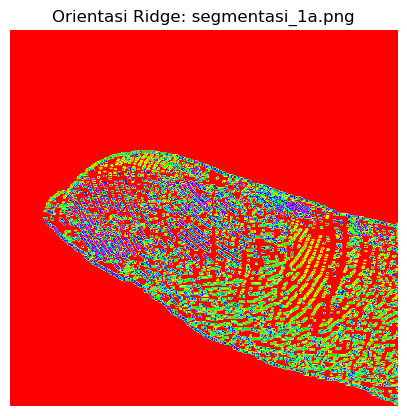

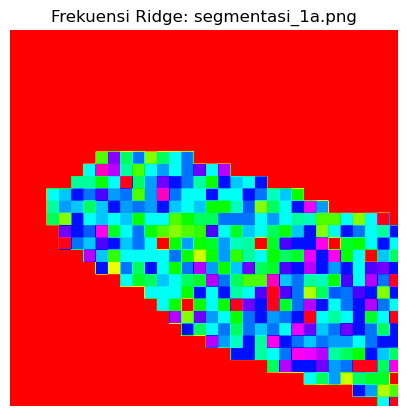

Membaca: hasil segmentasi\segmentasi_1b.png


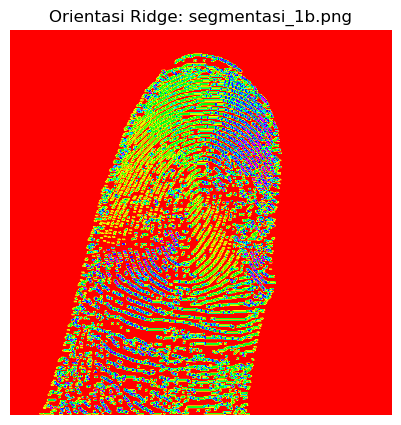

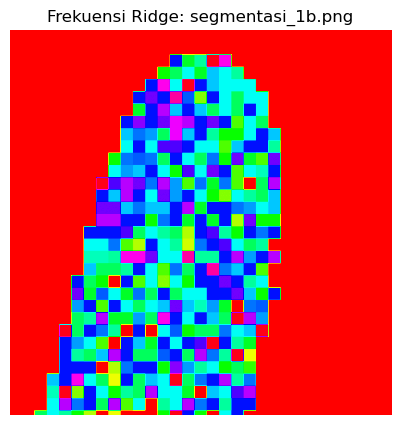

Membaca: hasil segmentasi\segmentasi_1c.png


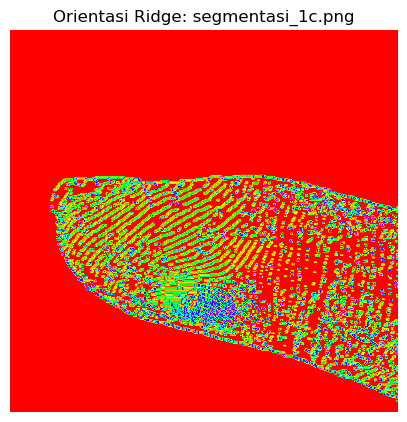

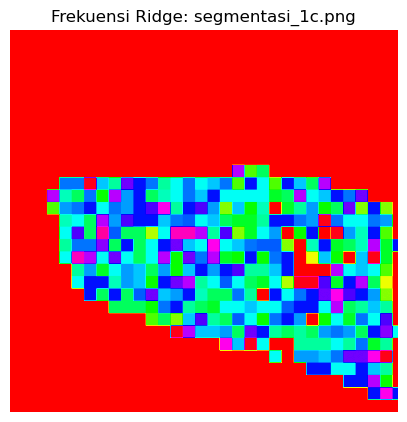

Membaca: hasil segmentasi\segmentasi_2a.png


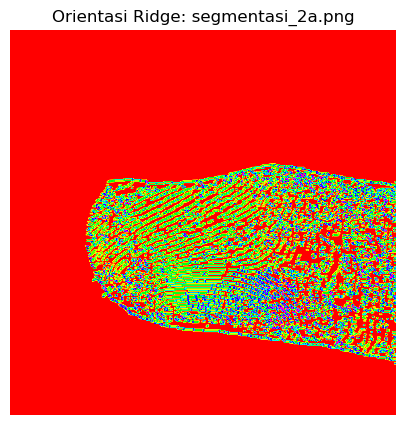

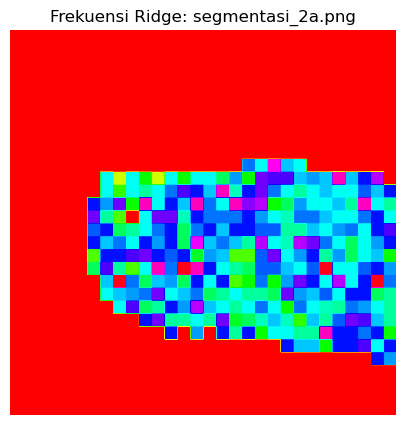

Membaca: hasil segmentasi\segmentasi_2b.png


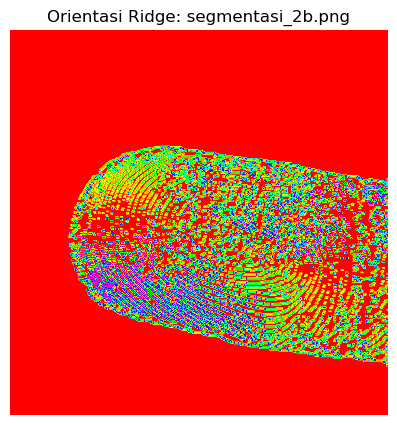

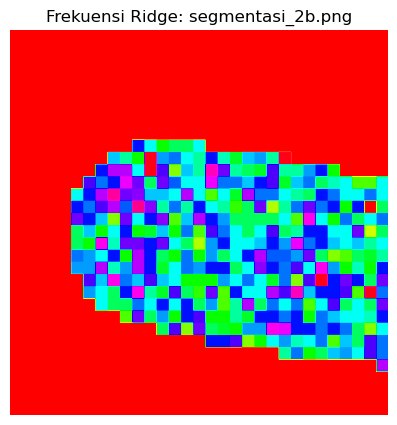

Membaca: hasil segmentasi\segmentasi_2c.png


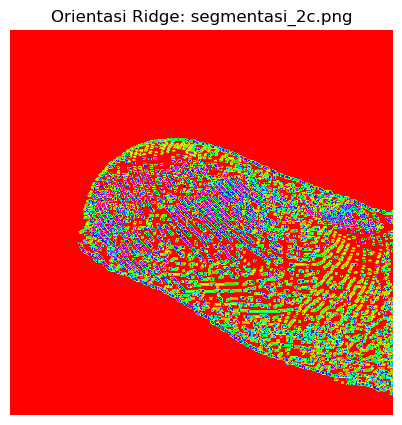

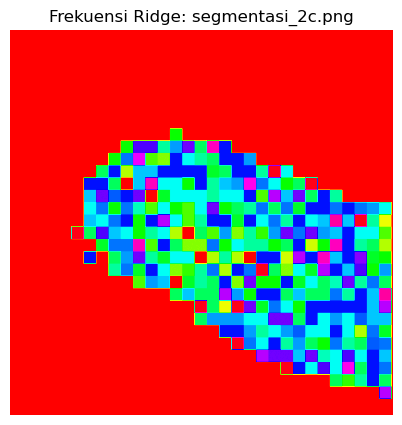

Membaca: hasil segmentasi\segmentasi_3a.png


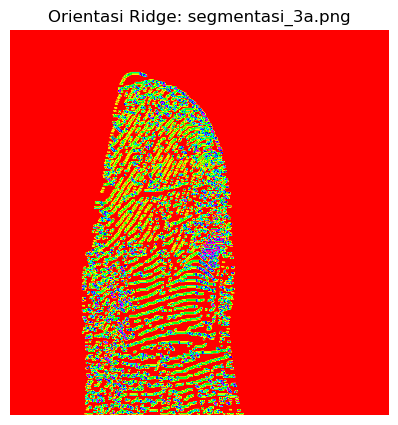

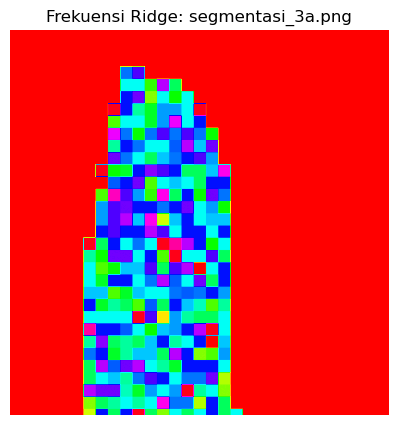

Membaca: hasil segmentasi\segmentasi_3b.png


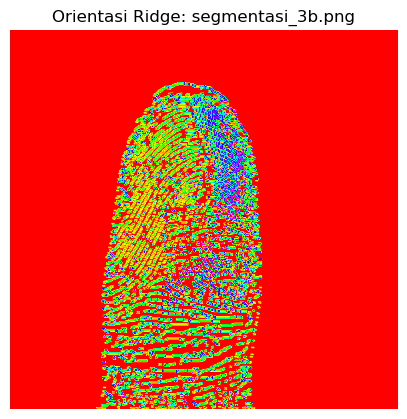

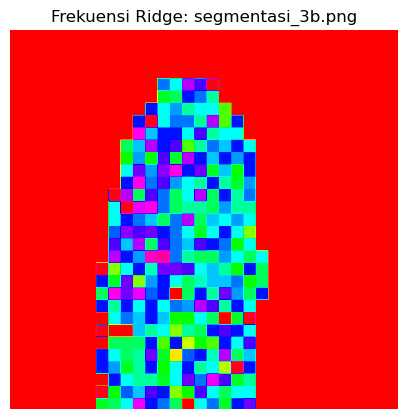

Membaca: hasil segmentasi\segmentasi_3c.png


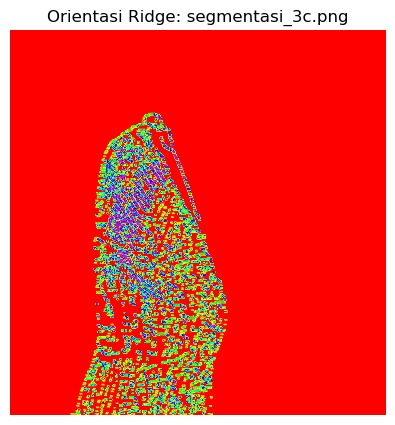

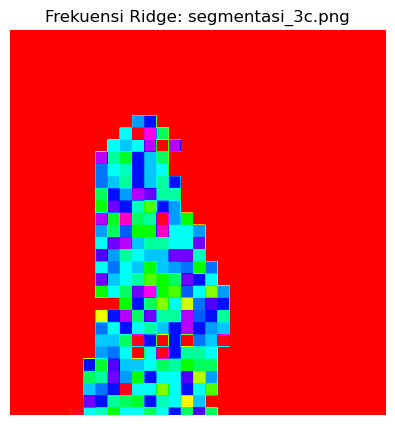

Membaca: hasil segmentasi\segmentasi_4a.png


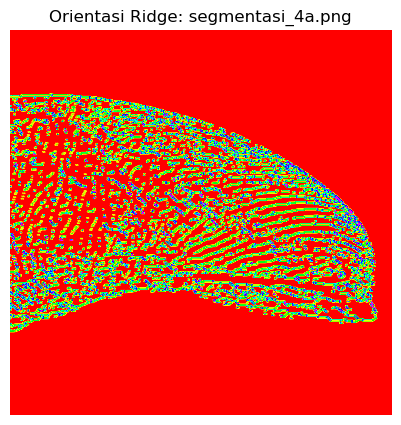

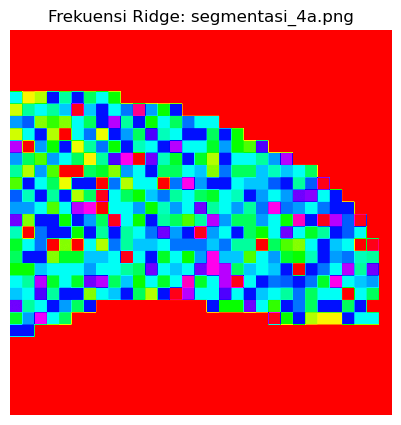

Membaca: hasil segmentasi\segmentasi_4b.png


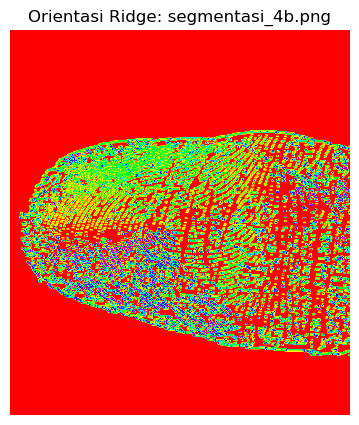

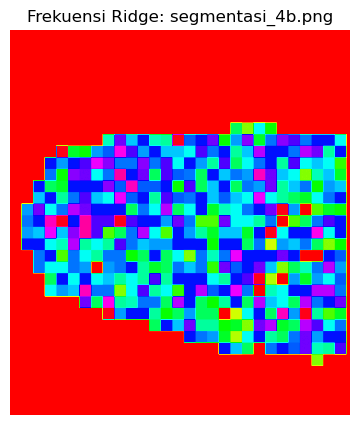

Membaca: hasil segmentasi\segmentasi_4c.png


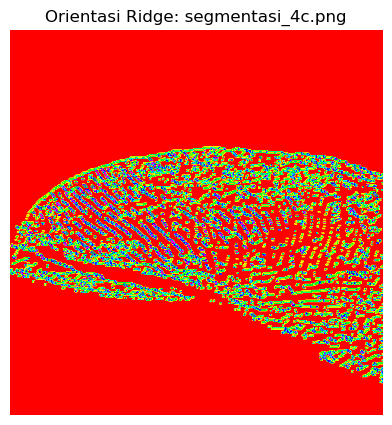

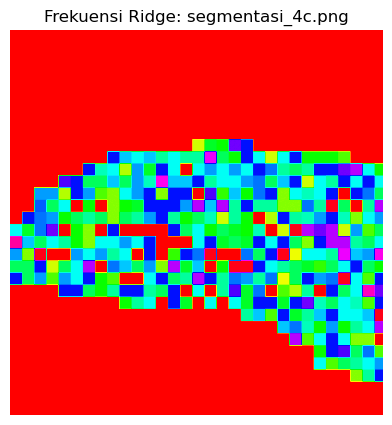

Membaca: hasil segmentasi\segmentasi_5a.png


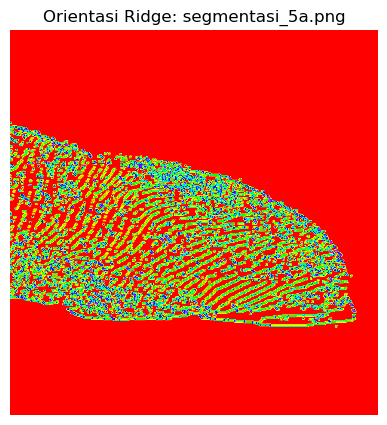

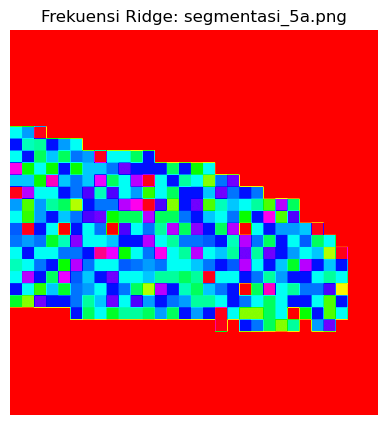

Membaca: hasil segmentasi\segmentasi_5b.png


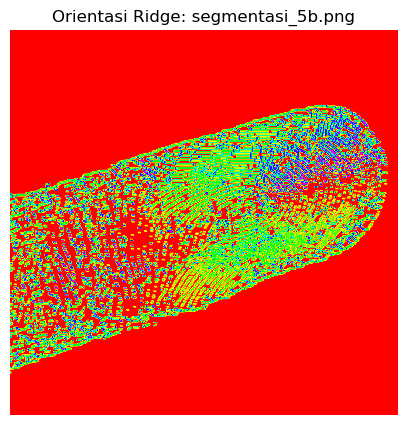

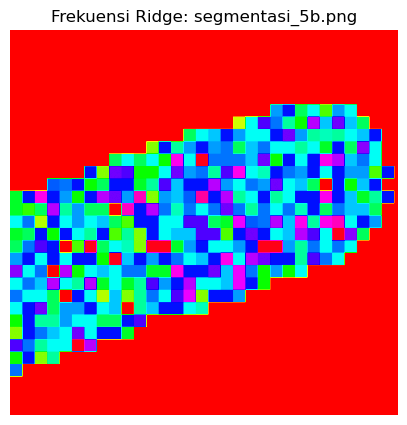

Membaca: hasil segmentasi\segmentasi_5c.png


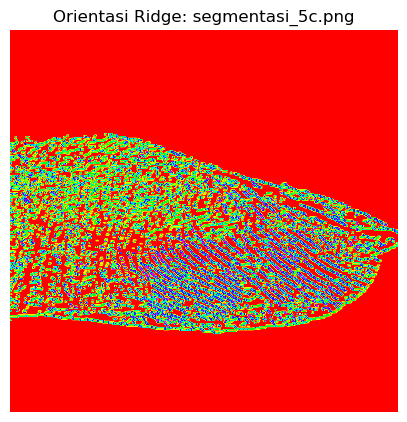

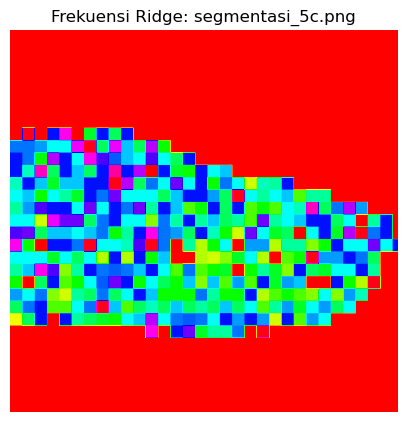

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Fungsi untuk menampilkan citra
def show_image(title, image, cmap_type='gray'):
    plt.figure(figsize=(5, 5))
    plt.title(title)
    plt.imshow(image, cmap=cmap_type)
    plt.axis('off')
    plt.show()

# Fungsi untuk menghitung orientasi ridge
def compute_orientation(image, block_size):
    gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    
    orientation = np.arctan2(gradient_y, gradient_x)
    orientation = np.rad2deg(orientation)
    orientation = (orientation + 180) % 180  # Normalisasi antara 0-180 derajat
    
    return orientation

# Fungsi untuk menghitung frekuensi ridge
def compute_frequency(image, orientation, block_size):
    frequency = np.zeros(image.shape)
    
    for i in range(0, image.shape[0], block_size):
        for j in range(0, image.shape[1], block_size):
            block = image[i:i+block_size, j:j+block_size]
            block_orientation = orientation[i:i+block_size, j:j+block_size]
            block_orientation_mean = np.mean(block_orientation)
            
            if np.isnan(block_orientation_mean):
                continue
            
            rotated_block = rotate_block(block, -block_orientation_mean)
            profile = np.sum(rotated_block, axis=0)
            peaks = find_peaks(profile)
            
            if len(peaks) > 1:
                ridge_spacing = np.mean(np.diff(peaks))
                if ridge_spacing != 0:
                    frequency[i:i+block_size, j:j+block_size] = 1.0 / ridge_spacing
    
    return frequency

# Fungsi untuk memutar blok citra
def rotate_block(block, angle):
    center = (block.shape[1] // 2, block.shape[0] // 2)
    rot_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_block = cv2.warpAffine(block, rot_matrix, (block.shape[1], block.shape[0]), flags=cv2.INTER_LINEAR)
    return rotated_block

# Fungsi untuk menemukan puncak pada profil ridge
def find_peaks(profile):
    peaks = []
    for i in range(1, len(profile)-1):
        if profile[i-1] < profile[i] and profile[i] > profile[i+1]:
            peaks.append(i)
    return peaks

# Path ke folder dengan foto-foto sidik jari
folder_path = 'hasil segmentasi'

# Loop melalui setiap file dalam folder
for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
        image_path = os.path.join(folder_path, filename)
        print(f"Membaca: {image_path}")

        # Membaca citra grayscale
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"Gagal membaca citra: {image_path}")
            continue
        
        # Melakukan histogram equalization
        equalized_image = cv2.equalizeHist(image)

        # Binarisasi citra
        _, binary_image = cv2.threshold(equalized_image, 127, 255, cv2.THRESH_BINARY)

        # Thinning citra menggunakan Zhang-Suen thinning algorithm
        thinned_image = cv2.ximgproc.thinning(binary_image)

        # Ekstraksi orientasi ridge
        block_size = 16
        orientation = compute_orientation(thinned_image, block_size)

        # Ekstraksi frekuensi ridge
        frequency = compute_frequency(thinned_image, orientation, block_size)

        # Menampilkan hasil
        show_image(f"Orientasi Ridge: {filename}", orientation, cmap_type='hsv')
        show_image(f"Frekuensi Ridge: {filename}", frequency, cmap_type='hsv')


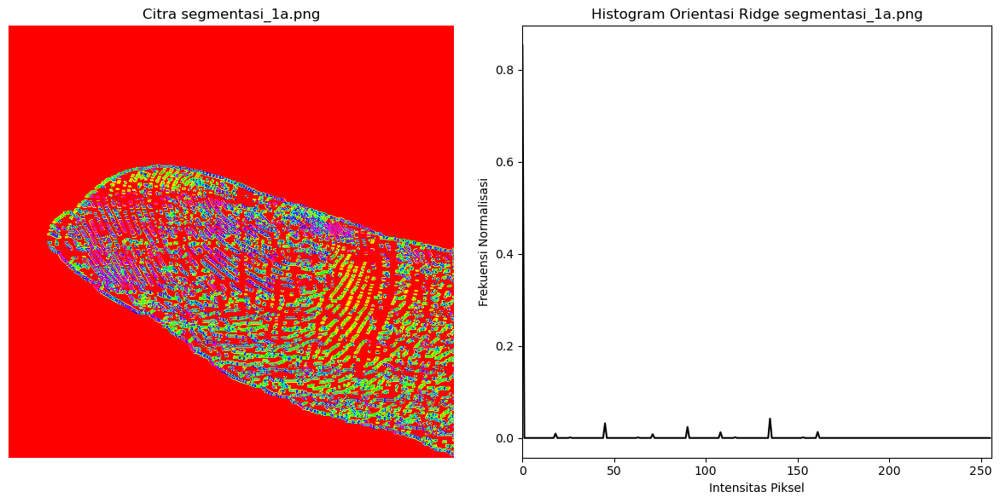

Nilai Histogram segmentasi_1a.png:
Intensitas 0: 212794.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2409.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 307.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 7959.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

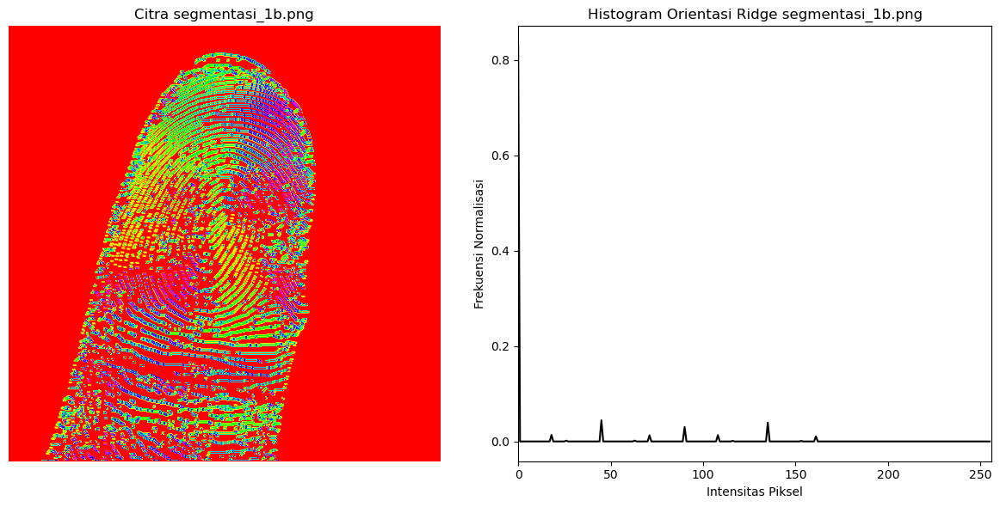

Nilai Histogram segmentasi_1b.png:
Intensitas 0: 206871.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 3439.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 431.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 11065.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 

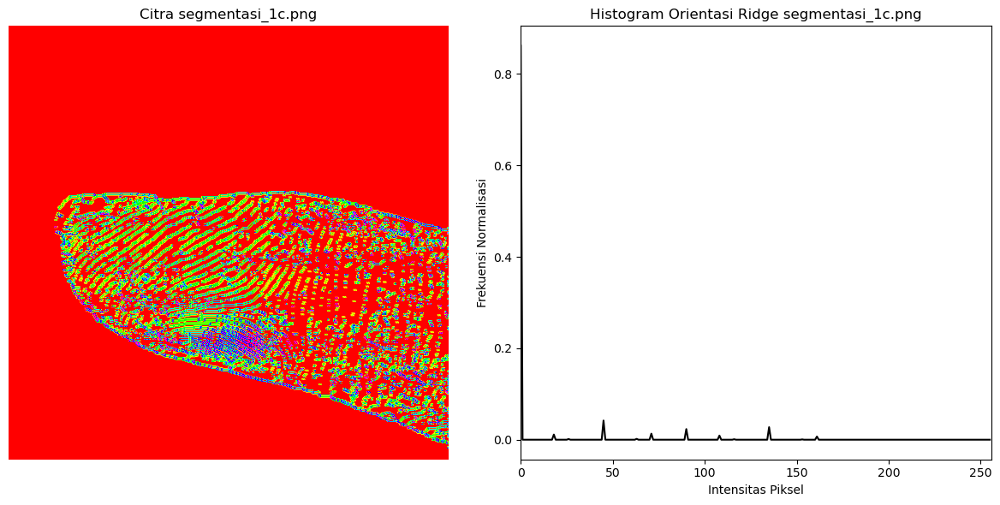

Nilai Histogram segmentasi_1c.png:
Intensitas 0: 214998.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2816.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 368.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 10459.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 

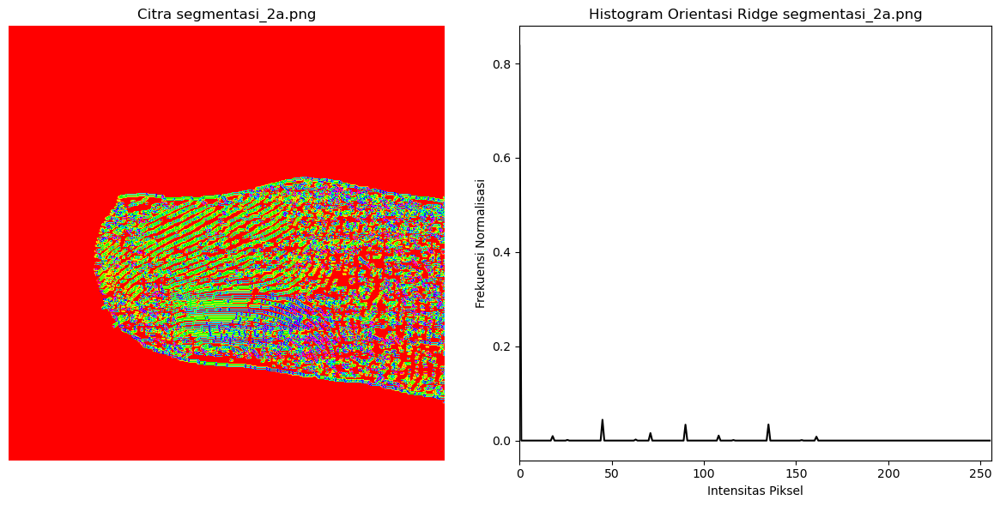

Nilai Histogram segmentasi_2a.png:
Intensitas 0: 191777.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2196.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 324.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 10111.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 

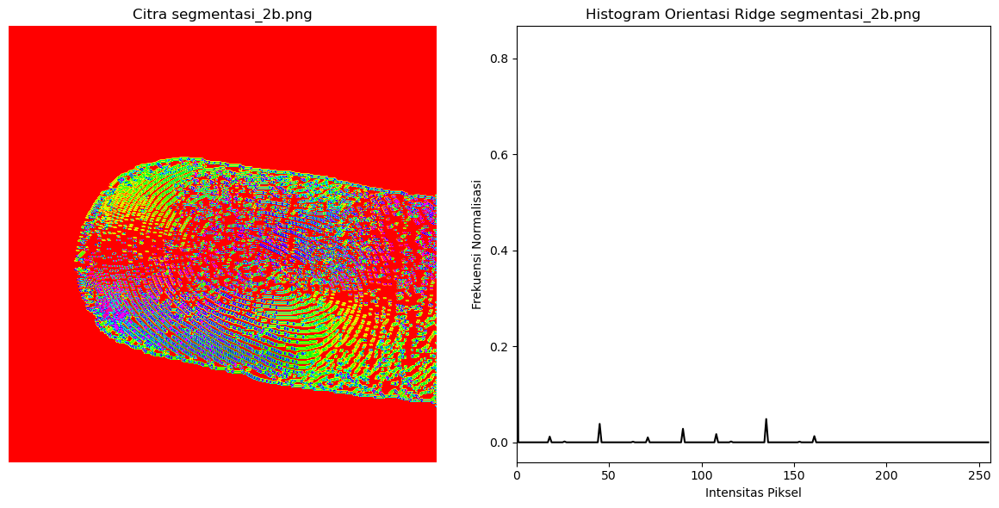

Nilai Histogram segmentasi_2b.png:
Intensitas 0: 206514.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2968.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 454.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 9622.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

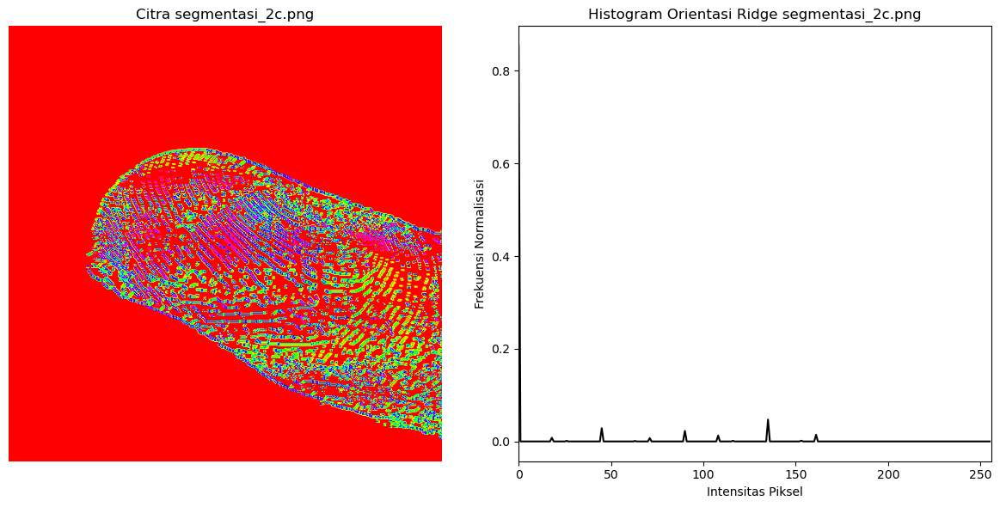

Nilai Histogram segmentasi_2c.png:
Intensitas 0: 213046.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 1981.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 302.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 7124.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

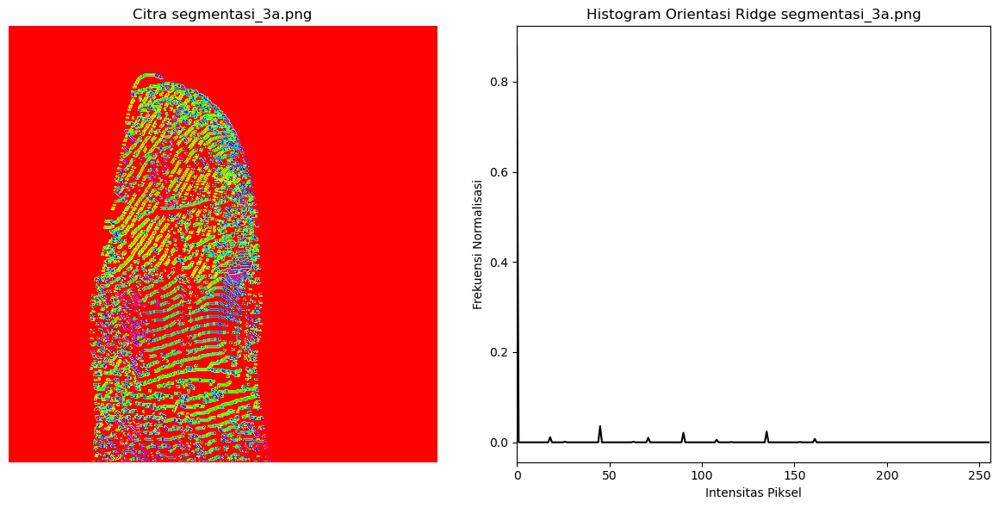

Nilai Histogram segmentasi_3a.png:
Intensitas 0: 219348.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2863.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 381.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 8959.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

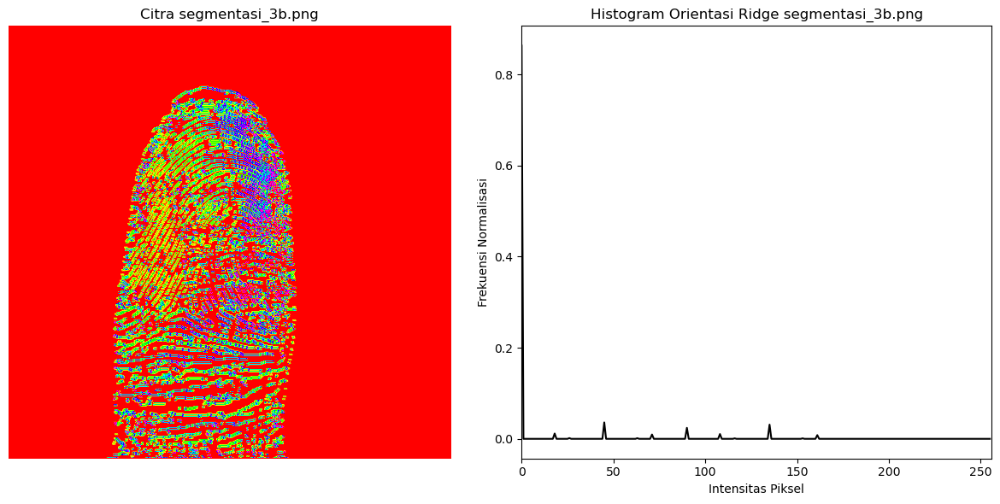

Nilai Histogram segmentasi_3b.png:
Intensitas 0: 215449.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2917.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 416.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 8994.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

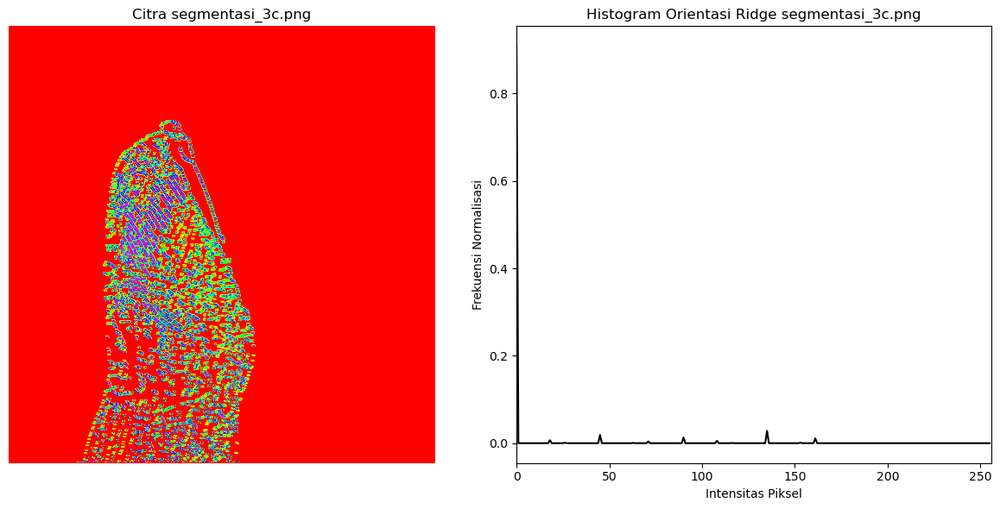

Nilai Histogram segmentasi_3c.png:
Intensitas 0: 226709.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 1697.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 285.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 4691.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

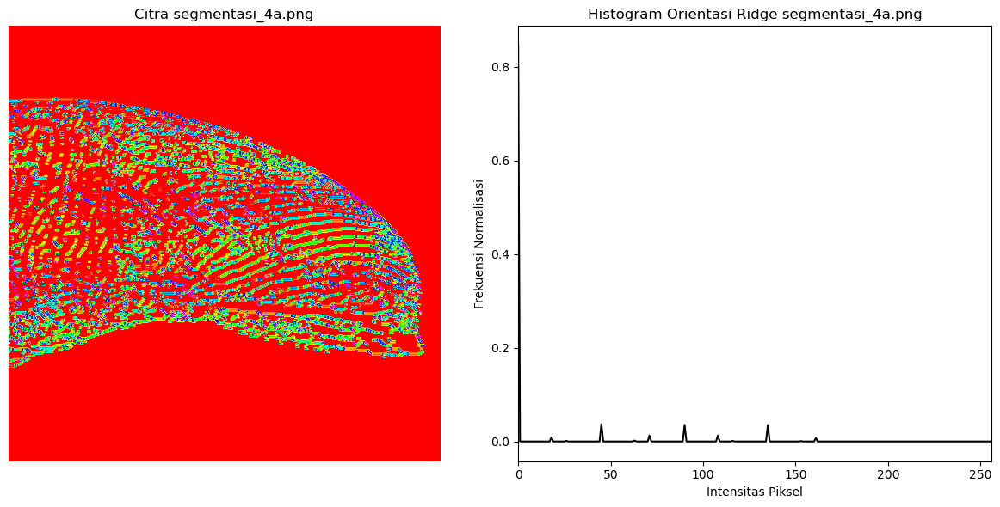

Nilai Histogram segmentasi_4a.png:
Intensitas 0: 210869.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2210.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 358.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 9231.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

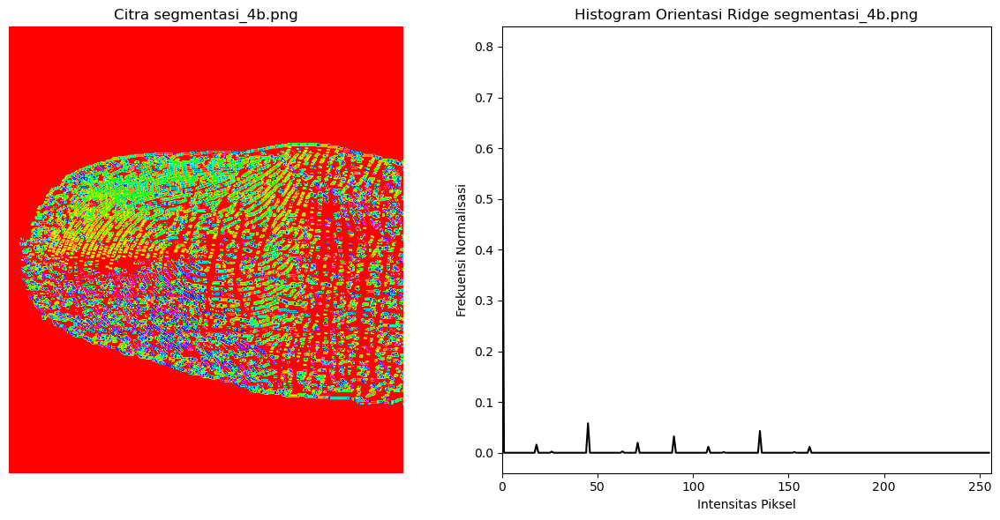

Nilai Histogram segmentasi_4b.png:
Intensitas 0: 199435.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 4007.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 577.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 14503.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 

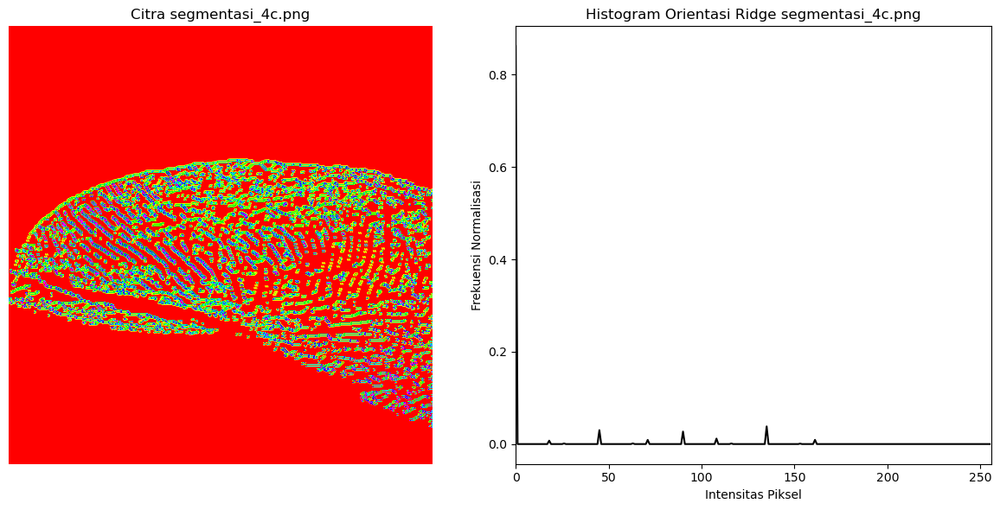

Nilai Histogram segmentasi_4c.png:
Intensitas 0: 215022.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 1838.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 330.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 7517.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

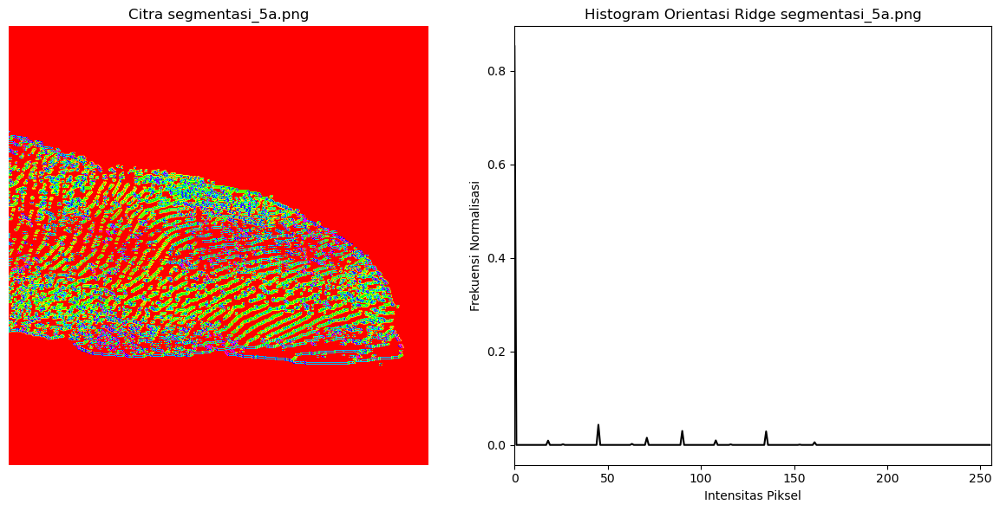

Nilai Histogram segmentasi_5a.png:
Intensitas 0: 212573.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2311.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 351.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 10758.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 

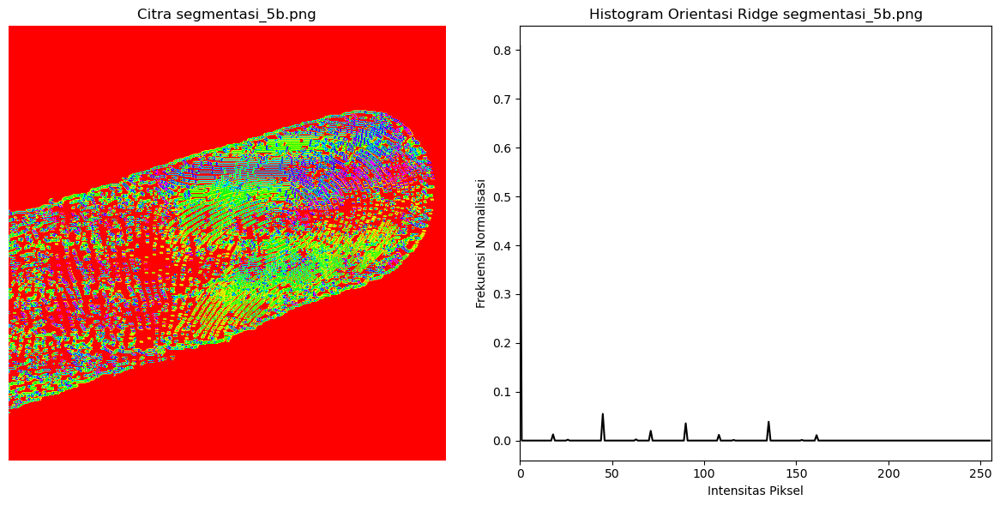

Nilai Histogram segmentasi_5b.png:
Intensitas 0: 201808.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 3170.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 462.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 13660.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 

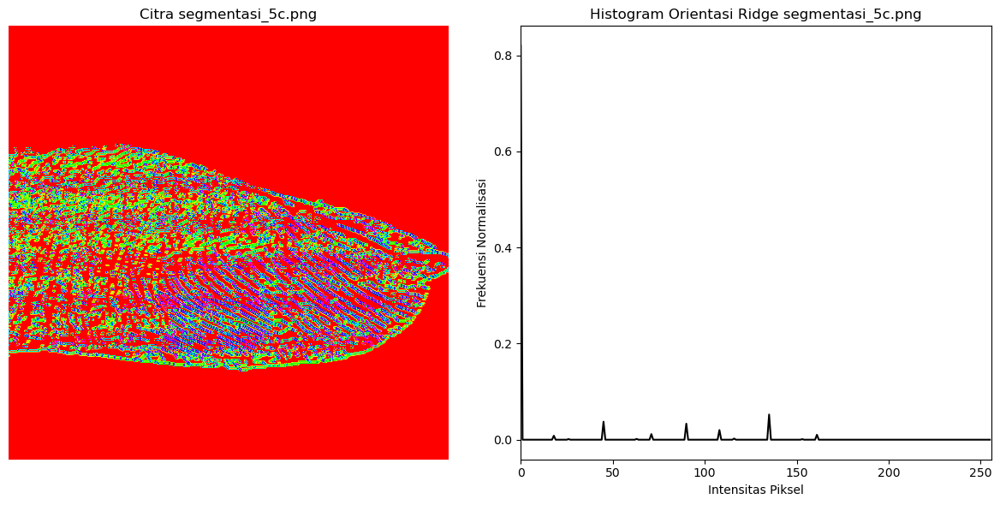

Nilai Histogram segmentasi_5c.png:
Intensitas 0: 204587.0
Intensitas 1: 0.0
Intensitas 2: 0.0
Intensitas 3: 0.0
Intensitas 4: 0.0
Intensitas 5: 0.0
Intensitas 6: 0.0
Intensitas 7: 0.0
Intensitas 8: 0.0
Intensitas 9: 0.0
Intensitas 10: 0.0
Intensitas 11: 0.0
Intensitas 12: 0.0
Intensitas 13: 0.0
Intensitas 14: 0.0
Intensitas 15: 0.0
Intensitas 16: 0.0
Intensitas 17: 0.0
Intensitas 18: 2069.0
Intensitas 19: 0.0
Intensitas 20: 0.0
Intensitas 21: 0.0
Intensitas 22: 0.0
Intensitas 23: 0.0
Intensitas 24: 0.0
Intensitas 25: 0.0
Intensitas 26: 329.0
Intensitas 27: 0.0
Intensitas 28: 0.0
Intensitas 29: 0.0
Intensitas 30: 0.0
Intensitas 31: 0.0
Intensitas 32: 0.0
Intensitas 33: 0.0
Intensitas 34: 0.0
Intensitas 35: 0.0
Intensitas 36: 0.0
Intensitas 37: 0.0
Intensitas 38: 0.0
Intensitas 39: 0.0
Intensitas 40: 0.0
Intensitas 41: 0.0
Intensitas 42: 0.0
Intensitas 43: 0.0
Intensitas 44: 0.0
Intensitas 45: 9329.0
Intensitas 46: 0.0
Intensitas 47: 0.0
Intensitas 48: 0.0
Intensitas 49: 0.0
Intensitas 5

In [22]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

# Fungsi untuk menampilkan citra
def show_image(title, image, cmap_type='gray'):
    plt.figure(figsize=(5, 5))
    plt.title(title)
    plt.imshow(image, cmap=cmap_type)
    plt.axis('off')
    plt.show()

# Fungsi untuk menghitung histogram dari citra ridge
def compute_histogram(orientation):
    # Menghitung histogram menggunakan OpenCV
    hist = cv2.calcHist([orientation.astype(np.float32)], [0], None, [256], [0, 256])
    hist_normalized = hist / np.sum(hist)  # Normalisasi histogram
    
    return hist_normalized, hist

# Fungsi untuk thinning citra biner
def thinning_image(binary_image):
    # Inisialisasi citra hasil thinning
    thinned_image = np.zeros(binary_image.shape, dtype=np.uint8)
    
    # Algoritma Zhang-Suen untuk thinning
    skeleton = cv2.ximgproc.thinning(binary_image)
    thinned_image[skeleton > 0] = 255
    
    return thinned_image

# Fungsi untuk menghitung orientasi ridge
def compute_orientation(image, block_size):
    gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    
    orientation = np.arctan2(gradient_y, gradient_x)
    orientation = np.rad2deg(orientation)
    orientation = (orientation + 180) % 180  # Normalisasi antara 0-180 derajat
    
    return orientation

# Daftar folder dengan citra sidik jari
folder_name = 'hasil segmentasi'  # Ubah sesuai dengan folder tempat Anda menyimpan citra

# Loop melalui setiap citra dalam folder
for filename in os.listdir(folder_name):
    if filename.endswith(".png"):
        image_path = os.path.join(folder_name, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Memeriksa apakah citra berhasil dibaca
        if image is None:
            print(f"Gagal membaca citra: {filename}")
            continue
        
        # Melakukan histogram equalization (opsional)
        equalized_image = cv2.equalizeHist(image)

        # Binarisasi citra
        _, binary_image = cv2.threshold(equalized_image, 127, 255, cv2.THRESH_BINARY)

        # Thinning citra menggunakan Zhang-Suen thinning algorithm
        thinned_image = thinning_image(binary_image)

        # Ekstraksi orientasi ridge
        block_size = 16
        orientation = compute_orientation(thinned_image, block_size)

        # Hitung histogram dari citra ridge
        ridge_histogram_normalized, ridge_histogram = compute_histogram(orientation)
        
        # Menampilkan citra dan histogram
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.title(f"Citra {filename}")
        plt.imshow(orientation, cmap='hsv')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title(f"Histogram Orientasi Ridge {filename}")
        plt.xlabel("Intensitas Piksel")
        plt.ylabel("Frekuensi Normalisasi")
        plt.plot(ridge_histogram_normalized, color='black')
        plt.xlim([0, 256])

        plt.tight_layout()
        plt.show()

        # Print nilai-nilai histogram
        print(f"Nilai Histogram {filename}:")
        for i in range(len(ridge_histogram)):
            print(f"Intensitas {i}: {ridge_histogram[i][0]}")
        print()


In [1]:
pip install opencv-contrib-python

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import csv

# Fungsi untuk menampilkan citra
def show_image(title, image, cmap_type='gray'):
    plt.figure(figsize=(5, 5))
    plt.title(title)
    plt.imshow(image, cmap=cmap_type)
    plt.axis('off')
    plt.show()

# Fungsi untuk menghitung histogram dari citra ridge
def compute_histogram(orientation):
    # Menghitung histogram menggunakan OpenCV
    hist = cv2.calcHist([orientation.astype(np.float32)], [0], None, [256], [0, 256])
    hist_normalized = hist / np.sum(hist)  # Normalisasi histogram
    
    return hist_normalized, hist

# Fungsi untuk thinning citra biner
def thinning_image(binary_image):
    # Inisialisasi citra hasil thinning
    thinned_image = np.zeros(binary_image.shape, dtype=np.uint8)
    
    # Algoritma Zhang-Suen untuk thinning
    skeleton = cv2.ximgproc.thinning(binary_image)
    thinned_image[skeleton > 0] = 255
    
    return thinned_image

# Fungsi untuk menghitung orientasi ridge
def compute_orientation(image, block_size):
    gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    
    orientation = np.arctan2(gradient_y, gradient_x)
    orientation = np.rad2deg(orientation)
    orientation = (orientation + 180) % 180  # Normalisasi antara 0-180 derajat
    
    return orientation

# Daftar folder dengan citra sidik jari
folder_name = 'hasil segmentasi'  # Ubah sesuai dengan folder tempat Anda menyimpan citra

# Membuka file CSV untuk menulis fitur
with open('features.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["filename"] + [f"feature_{i}" for i in range(256)])  # Header CSV

    # Loop melalui setiap citra dalam folder
    for filename in os.listdir(folder_name):
        if filename.endswith(".png"):
            image_path = os.path.join(folder_name, filename)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            if image is None:
                print(f"Gagal membaca citra: {filename}")
                continue
            
            equalized_image = cv2.equalizeHist(image)
            _, binary_image = cv2.threshold(equalized_image, 127, 255, cv2.THRESH_BINARY)
            thinned_image = thinning_image(binary_image)
            orientation = compute_orientation(thinned_image, block_size=16)
            ridge_histogram_normalized, _ = compute_histogram(orientation)
            
            # Menulis fitur ke file CSV
            writer.writerow([filename] + ridge_histogram_normalized.flatten().tolist())


In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load data dari file CSV
data = pd.read_csv('features.csv')

# Misalnya, jika label ada dalam kolom terakhir
X = data.iloc[:, 1:-1].values  # Fitur
y = data.iloc[:, -1].values  # Label

# Pembagian data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [5]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Inisialisasi model
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Latih model
model.fit(X_train, y_train)

# Prediksi pada data uji
y_pred = model.predict(X_test)

# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

Accuracy: 1.0
